## Basic Information on dataset

In [2]:
import pandas as pd
import numpy as np
import seaborn as sns

import plotly
from plotly.offline import init_notebook_mode, iplot, plot
import plotly.graph_objs as go

import squarify # for tree maps
import matplotlib.pyplot as plt
init_notebook_mode(connected=True)
import plotly.express as px

In [3]:
tel=pd.read_csv("telecom_churn_data.csv")
display(tel.head())
print("shape",tel.shape)

,customerID,tenure,PhoneService,Contract,PaperlessBilling,PaymentMethod,MonthlyCharges,TotalCharges,Churn,gender,...,Partner,Dependents,MultipleLines,InternetService,OnlineSecurity,OnlineBackup,DeviceProtection,TechSupport,StreamingTV,StreamingMovies
0,7590-VHVEG,1,No,Month-to-month,Yes,Electronic check,29.85,29.85,No,Female,...,Yes,No,No phone service,DSL,No,Yes,No,No,No,No
1,5575-GNVDE,34,Yes,One year,No,Mailed check,56.95,1889.5,No,Male,...,No,No,No,DSL,Yes,No,Yes,No,No,No
2,3668-QPYBK,2,Yes,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,Male,...,No,No,No,DSL,Yes,Yes,No,No,No,No
3,7795-CFOCW,45,No,One year,No,Bank transfer (automatic),42.30,1840.75,No,Male,...,No,No,No phone service,DSL,Yes,No,Yes,Yes,No,No
4,9237-HQITU,2,Yes,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,Female,...,No,No,No,Fiber optic,No,No,No,No,No,No


shape (7043, 21)


In [4]:
del(tel['customerID'])

In [5]:
tel.SeniorCitizen.dtypes

dtype('int64')

In [6]:
print("columns of the tel",tel.columns)
display(tel.dtypes)

columns of the tel Index(['tenure', 'PhoneService', 'Contract', 'PaperlessBilling',
       'PaymentMethod', 'MonthlyCharges', 'TotalCharges', 'Churn', 'gender',
       'SeniorCitizen', 'Partner', 'Dependents', 'MultipleLines',
       'InternetService', 'OnlineSecurity', 'OnlineBackup', 'DeviceProtection',
       'TechSupport', 'StreamingTV', 'StreamingMovies'],
      dtype='object')


tenure                int64
PhoneService         object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges         object
Churn                object
gender               object
SeniorCitizen         int64
Partner              object
Dependents           object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
dtype: object

In [7]:
tel.isnull().sum()

tenure              0
PhoneService        0
Contract            0
PaperlessBilling    0
PaymentMethod       0
MonthlyCharges      0
TotalCharges        0
Churn               0
gender              0
SeniorCitizen       0
Partner             0
Dependents          0
MultipleLines       0
InternetService     0
OnlineSecurity      0
OnlineBackup        0
DeviceProtection    0
TechSupport         0
StreamingTV         0
StreamingMovies     0
dtype: int64

In [8]:
len(tel[tel.duplicated()])

22

In [9]:
tel.describe(include="all").T

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
tenure,7043.0,NaN,NaN,NaN,32.371149,24.559481,0.0,9.0,29.0,55.0,72.0
PhoneService,7043,2,Yes,6361,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Contract,7043,3,Month-to-month,3875,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PaperlessBilling,7043,2,Yes,4171,NaN,NaN,NaN,NaN,NaN,NaN,NaN
PaymentMethod,7043,4,Electronic check,2365,NaN,NaN,NaN,NaN,NaN,NaN,NaN
MonthlyCharges,7043.0,NaN,NaN,NaN,64.761692,30.090047,18.25,35.5,70.35,89.85,118.75
TotalCharges,7043,6531,,11,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Churn,7043,2,No,5174,NaN,NaN,NaN,NaN,NaN,NaN,NaN
gender,7043,2,Male,3555,NaN,NaN,NaN,NaN,NaN,NaN,NaN
SeniorCitizen,7043.0,NaN,NaN,NaN,0.162147,0.368612,0.0,0.0,0.0,0.0,1.0


In [10]:
tel['Churn'].unique()

array(['No', 'Yes'], dtype=object)

In [11]:
tel['Churn'].nunique()

2

In [12]:
tel.TotalCharges.nunique()

6531

In [13]:
for i in tel.columns:
    print ("Number of unique values in {} column are {} \n The unique values are {}".format(i, len(tel[i].unique()),tel[i].unique()))
    print ("---------------------- \n")

Number of unique values in tenure column are 73 
 The unique values are [ 1 34  2 45  8 22 10 28 62 13 16 58 49 25 69 52 71 21 12 30 47 72 17 27
  5 46 11 70 63 43 15 60 18 66  9  3 31 50 64 56  7 42 35 48 29 65 38 68
 32 55 37 36 41  6  4 33 67 23 57 61 14 20 53 40 59 24 44 19 54 51 26  0
 39]
---------------------- 

Number of unique values in PhoneService column are 2 
 The unique values are ['No' 'Yes']
---------------------- 

Number of unique values in Contract column are 3 
 The unique values are ['Month-to-month' 'One year' 'Two year']
---------------------- 

Number of unique values in PaperlessBilling column are 2 
 The unique values are ['Yes' 'No']
---------------------- 

Number of unique values in PaymentMethod column are 4 
 The unique values are ['Electronic check' 'Mailed check' 'Bank transfer (automatic)'
 'Credit card (automatic)']
---------------------- 

Number of unique values in MonthlyCharges column are 1585 
 The unique values are [29.85 56.95 53.85 ... 63.1  4

In [14]:
from ipywidgets import interact, interactive, fixed, interact_manual
import ipywidgets as widgets
@interact(feature=tel.columns.to_list())
def describe_features(feature):
    print ("Number of unique values in {} column are {} \n The unique values are {}".format(feature, len(tel[feature].unique()),tel[feature].unique()))

interactive(children=(Dropdown(description='feature', options=('tenure', 'PhoneService', 'Contract', 'Paperles…

In [15]:
SeniorCitizen_dict={0:'No',1:'Yes'}
tel=tel.replace({'SeniorCitizen':SeniorCitizen_dict})
tel['SeniorCitizen'].value_counts()

No     5901
Yes    1142
Name: SeniorCitizen, dtype: int64

In [16]:
cat_cols=[]
for i in tel.columns:
    if tel[i].dtypes=="object":
        cat_cols.append(i)
cat_cols.remove('TotalCharges')
cat_cols

['PhoneService',
 'Contract',
 'PaperlessBilling',
 'PaymentMethod',
 'Churn',
 'gender',
 'SeniorCitizen',
 'Partner',
 'Dependents',
 'MultipleLines',
 'InternetService',
 'OnlineSecurity',
 'OnlineBackup',
 'DeviceProtection',
 'TechSupport',
 'StreamingTV',
 'StreamingMovies']

In [17]:
num_cols=[i for i in tel.columns if i not in cat_cols]
num_cols

['tenure', 'MonthlyCharges', 'TotalCharges']

In [18]:
tel['TotalCharges']=pd.to_numeric(tel['TotalCharges'],errors='coerce')
tel.dtypes

tenure                int64
PhoneService         object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                object
gender               object
SeniorCitizen        object
Partner              object
Dependents           object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
dtype: object

###### Upto now we observed 7043 rows, 21 columns in dataset out of there
###### 1 Float DataType,
###### 2 Int Dataypes,
###### 18 Object Datatypes i.e Categorical variable,
###### And one num-cat variable
###### No Null values,
###### No Duplicate values

## Univarient Analaysis

#### 1. What is Churn Rate in the company?

In [19]:
temp_churn=tel.Churn.value_counts()
display(temp_churn)

No     5174
Yes    1869
Name: Churn, dtype: int64

In [20]:
trace_churn=go.Bar(x=temp_churn.index,y=temp_churn.values,text=temp_churn.values)
tel_churn=[trace_churn]
layout=go.Layout(title='Churn sample plot',width=600,height=400)
fig=go.Figure(data=tel_churn,layout=layout)
iplot(fig)

In [21]:
import plotly
from plotly.offline import iplot, init_notebook_mode
init_notebook_mode(connected = True)
import plotly.graph_objs as go
trace = go.Pie(labels = temp_churn.index, values = temp_churn.values)
data = [trace]
fig = go.Figure(data = data,layout=layout)
iplot(fig)

<AxesSubplot:title={'center':'Percentage of churn'}, ylabel='Churn'>

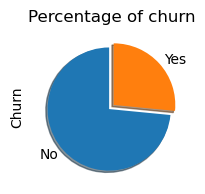

In [22]:
tel.Churn.value_counts().plot.pie(explode=[0.05,0.05],startangle=90,shadow=True,figsize=(2,2),title='Percentage of churn')

#### 2. What is Gender Rate in the company?

In [23]:
temp_gen=tel.gender.value_counts()
display(temp_gen)
print(temp_gen.index)
print('Gender values',temp_gen.values)

Male      3555
Female    3488
Name: gender, dtype: int64

Index(['Male', 'Female'], dtype='object')
Gender values [3555 3488]


In [24]:
trace_gen=go.Bar(x=temp_gen.index,y=temp_gen.values)
tel_gen=[trace_gen]
layout=go.Layout(title='Gender sample plot',width=600,height=400)
fig1=go.Figure(data=tel_gen,layout=layout)
iplot(fig1)

#### 3.What is married Status in the company?

#### 4. Payment Method 

In [25]:
temp_marr=tel.Partner.value_counts()
print(temp_marr)
print('index',temp_marr.index)
print('values',temp_marr.values)

No     3641
Yes    3402
Name: Partner, dtype: int64
index Index(['No', 'Yes'], dtype='object')
values [3641 3402]


In [26]:
trace_marr=go.Bar(x=temp_marr.index,y=temp_marr.values)
tel_gen=[trace_marr]
layout=go.Layout(title='Married Status sample plot',width=600,height=400)
fig2=go.Figure(data=tel_gen,layout=layout)
iplot(fig2)

In [27]:
temp_pay=tel.PaymentMethod.value_counts()
print(temp_pay)
print('index',temp_pay.index)
print('values',temp_pay.values)

Electronic check             2365
Mailed check                 1612
Bank transfer (automatic)    1544
Credit card (automatic)      1522
Name: PaymentMethod, dtype: int64
index Index(['Electronic check', 'Mailed check', 'Bank transfer (automatic)',
       'Credit card (automatic)'],
      dtype='object')
values [2365 1612 1544 1522]


In [28]:
trace_marr1=go.Bar(x=temp_pay.index,y=temp_pay.values)
tel_gen1=[trace_marr1]
layout=go.Layout(title='Payment best Method sample plot',width=600,height=400)
fig3=go.Figure(data=tel_gen1,layout=layout)
iplot(fig3)

In [29]:
tel.dtypes

tenure                int64
PhoneService         object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                object
gender               object
SeniorCitizen        object
Partner              object
Dependents           object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
dtype: object

# FUNCTION AND UNIVARIATE ANALYSIS STARTS HERE

In [30]:
def plot_bar(col_name):
    temp = tel[col_name].value_counts()
    data = go.Bar(
            x=temp.index, # x axis values
            y=np.round(temp.values/temp.values.sum(),4)*100, # y axis values
            text = ['{}%'.format(i) for i in np.round(temp.values/temp.values.sum(),2)*100],
            textposition = 'auto',
        marker = dict(color = '#0047AB'),)
    return data
    

In [31]:
layout=go.Layout(title='Distribution of Churn',width=600,height=400)
fig1=go.Figure(data=plot_bar("Churn"),layout=layout)
iplot(fig1)

In [32]:
layout=go.Layout(title='Distribution of Gender',width=600,height=400)
fig4=go.Figure(data=plot_bar("gender"),layout=layout)
iplot(fig4)

In [33]:
layout=go.Layout(title='Distribution of dependents',width=600,height=400)
fig4=go.Figure(data=plot_bar("Dependents"),layout=layout)
iplot(fig4)

In [34]:
layout=go.Layout(title='Distribution of dependents',width=600,height=400)
fig5=go.Figure(data=plot_bar("PhoneService"),layout=layout)
iplot(fig5)

In [35]:
tel.dtypes

tenure                int64
PhoneService         object
Contract             object
PaperlessBilling     object
PaymentMethod        object
MonthlyCharges      float64
TotalCharges        float64
Churn                object
gender               object
SeniorCitizen        object
Partner              object
Dependents           object
MultipleLines        object
InternetService      object
OnlineSecurity       object
OnlineBackup         object
DeviceProtection     object
TechSupport          object
StreamingTV          object
StreamingMovies      object
dtype: object

In [36]:

from plotly.subplots import make_subplots
fig =make_subplots(rows=3, cols=3,subplot_titles=("Distribution of Churn", "Distribution of Gender", "Distribution of Marital status", "Distribution of Children","Distribution of SeniorCitizen","Distribution of OnlineSecurity","Distribution of PaymentMethod","Distribution of InternetService","Distribution of OnlineBackup"))
fig.add_trace(plot_bar("Churn"), row=1,col=1)
fig.add_trace(plot_bar("gender"), row=1, col=2)
fig.add_trace(plot_bar("Partner"), row=1, col=3)
fig.add_trace(plot_bar("Dependents"), row=2, col=1)
fig.add_trace(plot_bar("SeniorCitizen"), row=2,col=2)
fig.add_trace(plot_bar("OnlineSecurity"), row=2, col=3)
fig.add_trace(plot_bar("PaymentMethod"), row=3, col=1)
fig.add_trace(plot_bar("InternetService"), row=3,col=2)
fig.add_trace(plot_bar("OnlineBackup"), row=3, col=3)

fig.update_layout(height=800, width=1000,
                  title_text="UNIVARIATE ANALYSIS OF FEATURES", showlegend=False)
fig.show()

## Bivarient Analysis

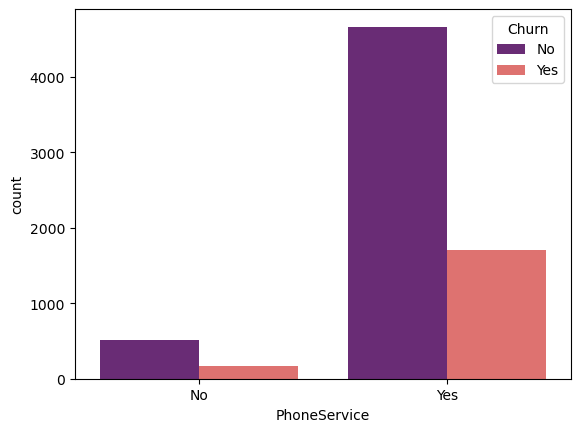

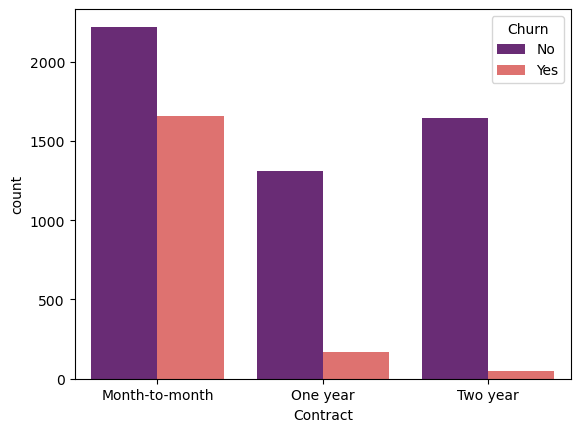

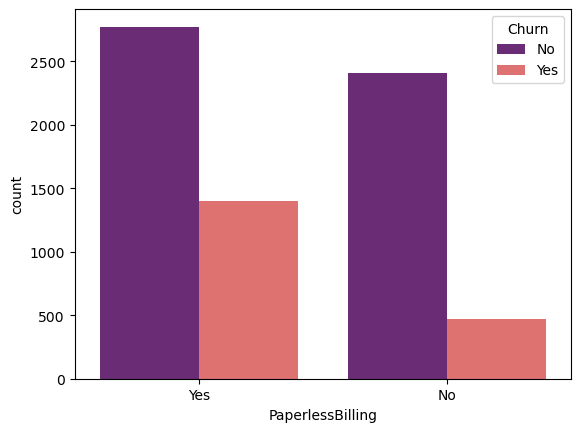

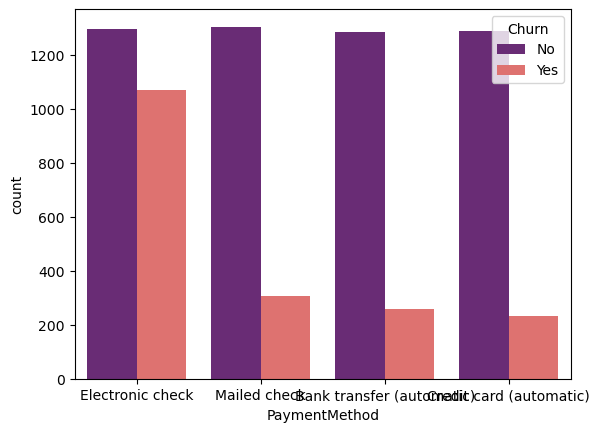

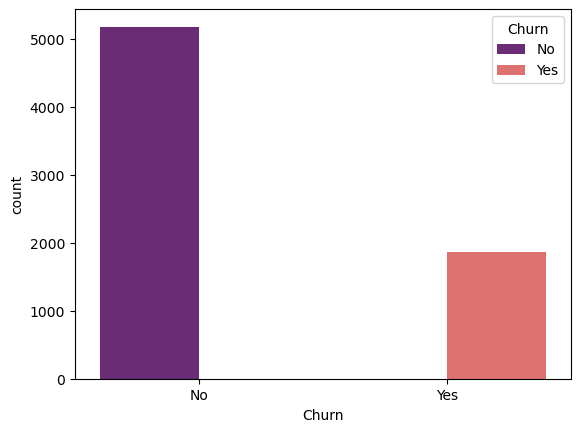

...

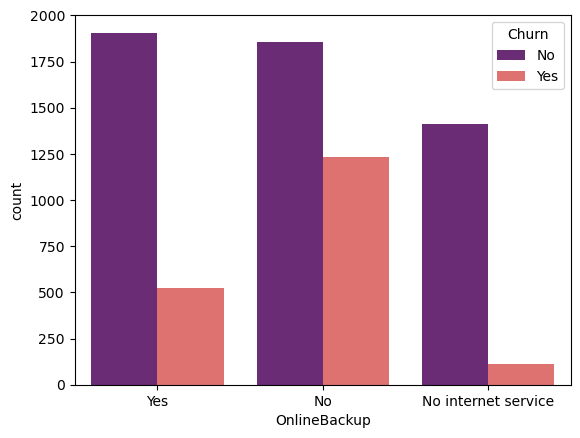

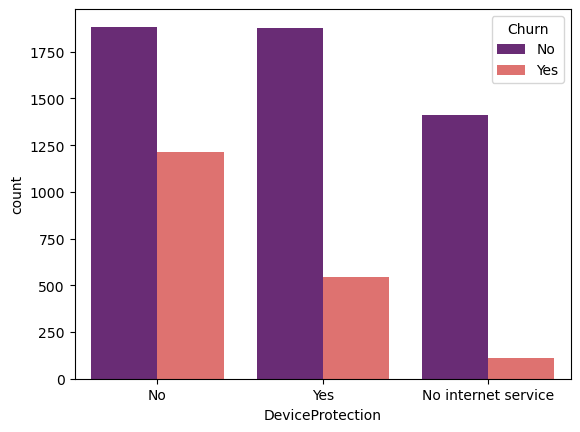

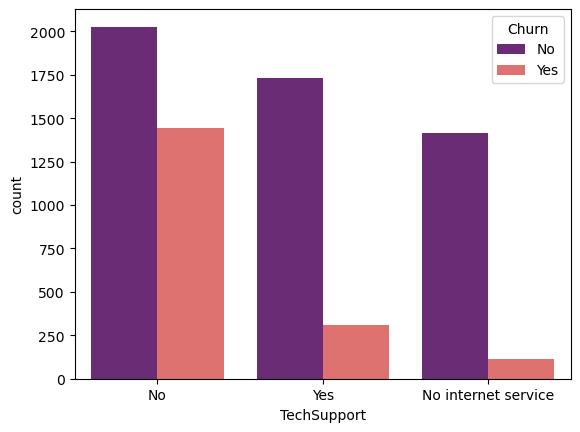

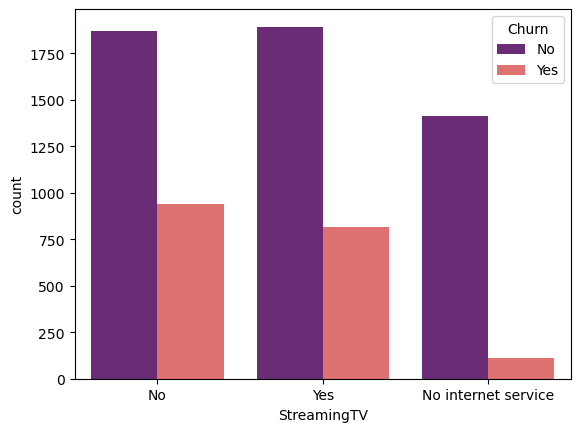

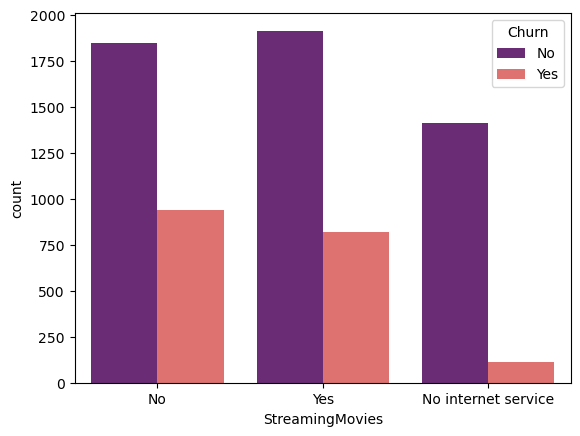

In [60]:
for i, predictor in enumerate(tel[cat_cols]):
    plt.figure(i)
    sns.countplot(data=tel, x=predictor, hue='Churn',palette="magma")

In [38]:
tel_dummies = pd.get_dummies(tel)
tel_dummies.head()

,tenure,MonthlyCharges,TotalCharges,PhoneService_No,PhoneService_Yes,Contract_Month-to-month,Contract_One year,Contract_Two year,PaperlessBilling_No,PaperlessBilling_Yes,...,DeviceProtection_Yes,TechSupport_No,TechSupport_No internet service,TechSupport_Yes,StreamingTV_No,StreamingTV_No internet service,StreamingTV_Yes,StreamingMovies_No,StreamingMovies_No internet service,StreamingMovies_Yes
0,1,29.85,29.85,1,0,1,0,0,0,1,...,0,1,0,0,1,0,0,1,0,0
1,34,56.95,1889.50,0,1,0,1,0,1,0,...,1,1,0,0,1,0,0,1,0,0
2,2,53.85,108.15,0,1,1,0,0,0,1,...,0,1,0,0,1,0,0,1,0,0
3,45,42.30,1840.75,1,0,0,1,0,1,0,...,1,0,0,1,1,0,0,1,0,0
4,2,70.70,151.65,0,1,1,0,0,0,1,...,0,1,0,0,1,0,0,1,0,0


In [73]:
tel_dummies.columns

Index(['tenure', 'MonthlyCharges', 'TotalCharges', 'PhoneService_No',
       'PhoneService_Yes', 'Contract_Month-to-month', 'Contract_One year',
       'Contract_Two year', 'PaperlessBilling_No', 'PaperlessBilling_Yes',
       'PaymentMethod_Bank transfer (automatic)',
       'PaymentMethod_Credit card (automatic)',
       'PaymentMethod_Electronic check', 'PaymentMethod_Mailed check',
       'Churn_No', 'Churn_Yes', 'gender_Female', 'gender_Male',
       'SeniorCitizen_No', 'SeniorCitizen_Yes', 'Partner_No', 'Partner_Yes',
       'Dependents_No', 'Dependents_Yes', 'MultipleLines_No',
       'MultipleLines_No phone service', 'MultipleLines_Yes',
       'InternetService_DSL', 'InternetService_Fiber optic',
       'InternetService_No', 'OnlineSecurity_No',
       'OnlineSecurity_No internet service', 'OnlineSecurity_Yes',
       'OnlineBackup_No', 'OnlineBackup_No internet service',
       'OnlineBackup_Yes', 'DeviceProtection_No',
       'DeviceProtection_No internet service', 'DevicePr

In [39]:
cat_cols

['PhoneService',
 'Contract',
 'PaperlessBilling',
 'PaymentMethod',
 'Churn',
 'gender',
 'SeniorCitizen',
 'Partner',
 'Dependents',
 'MultipleLines',
 'InternetService',
 'OnlineSecurity',
 'OnlineBackup',
 'DeviceProtection',
 'TechSupport',
 'StreamingTV',
 'StreamingMovies']

### Correlation

<AxesSubplot:>

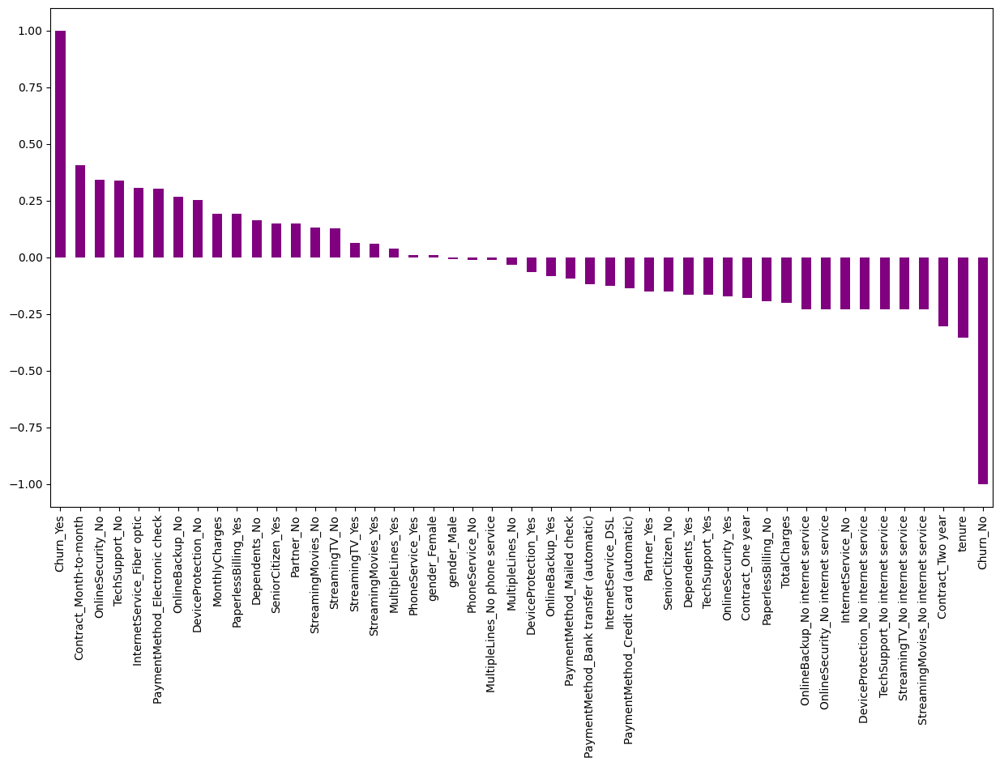

In [79]:
plt.figure(figsize=(15,8))
tel_dummies.corr()['Churn_Yes'].sort_values(ascending=False).plot(kind='bar',color="purple")

###  MonthlyCharges vs PhoneService

In [41]:
display(px.box(tel,y='MonthlyCharges',x='PhoneService',color='PhoneService',template='plotly'))
display(px.box(tel,y='TotalCharges',x='PhoneService',color='PhoneService',template='plotly'))

### MonthlyCharges vsSeniorCitizen

In [42]:
display(px.box(tel,y='MonthlyCharges',x='SeniorCitizen',color='SeniorCitizen',template='plotly'))
display(px.box(tel,y='TotalCharges',x='SeniorCitizen',color='SeniorCitizen',template='plotly'))

=> In the above box plot, whether a person is a senior citizen or not ha an impact of the total charges
=> Senior citizens usually work which means that they have higher income 
=> so that they might opting for more servics from teleco leading higher totalcharges


In [43]:
display(px.box(tel,y='MonthlyCharges',x='PaymentMethod',color='PaymentMethod',template='plotly'))
display(px.box(tel,y='TotalCharges',x='PaymentMethod',color='PaymentMethod',template='plotly'))

### DeviceProtection vs TotalCharges 
=> device protection plans have a very high cost as could be seen


=> This means that people are paying a lot for Device Protection plans

In [68]:
display(px.box(tel,y='TotalCharges',x='DeviceProtection',template='plotly'))

In [44]:
display(px.box(tel,y='MonthlyCharges',x='Dependents',color='PaymentMethod',template='plotly'))
display(px.box(tel,y='TotalCharges',x='Dependents',color='PaymentMethod',template='plotly'))

In [45]:
display(px.box(tel,y='MonthlyCharges',x='DeviceProtection',color='PaymentMethod',template='plotly'))
display(px.box(tel,y='TotalCharges',x='DeviceProtection',color='PaymentMethod',template='plotly'))

### Paperlessbilling vs charges
=> customers usually leverage their freedom to use thier credt/debit cards and pay more amount compared to others who prefer paperbilling options.


=> This is because it is more convenient to use.


=> so,whenever a customer is going to register for the service, telco can estimate the total charges that might be taken into consuideration based on whether a customer opts for paperless billing or not.

In [70]:
display(px.box(tel,y='MonthlyCharges',x='PaperlessBilling',template='plotly'))
display(px.box(tel,y='TotalCharges',x='PaperlessBilling',template='plotly'))

## MonthlyCharges vs Churn
  

In [66]:
display(px.box(tel,y='MonthlyCharges',x='Churn',template='plotly'))

### people who stay in the service usually have low monthly charges
so prices of various services must be reduced

## TotalCharges vs Churn

In [67]:
display(px.box(tel,y='TotalCharges',x='Churn',template='plotly'))

### To which Type of Internet Service high charges are paying..?

In [63]:
display(px.box(tel,y='MonthlyCharges',x='InternetService',template='plotly',title="InternetServices vs MonthlyCharges"))
display(px.box(tel,y='TotalCharges',x='InternetService',template='plotly',title="InternetServices vs TotalCharges"))

### For which type of Internet services does Seniorcitizens paying high charges ..?

In [47]:
display(px.box(tel,y='MonthlyCharges',x='SeniorCitizen',color='InternetService',template='plotly'))
display(px.box(tel,y='TotalCharges',x='SeniorCitizen',color='InternetService',template='plotly'))

### For which type of Internet services does Retired citizens/Children paying high charges ..?

In [48]:
display(px.box(tel,y='MonthlyCharges',x='Dependents',color='InternetService',template='plotly'))
display(px.box(tel,y='TotalCharges',x='Dependents',color='InternetService',template='plotly'))

### Which type of  InternetService is used for longer duration..?

In [49]:
display(px.box(tel,y='tenure',x='InternetService',template='plotly'))
display(px.box(tel,y='tenure',x='InternetService',template='plotly'))

### How do Total Usage and Total Charges vary..?

In [50]:
trace = go.Scatter(x=tel.tenure ,
                  y= tel.TotalCharges,
                  name = 'Age and MonthlyIncome',
                  mode= 'markers')
data = [trace]
layout = go.Layout(title = ' Total Usage and Total Charges distribution',
                  xaxis = dict(title = 'Tenure'),
                  yaxis = dict(title = 'Total Charges'))
fig = go.Figure(data=data,layout=layout)
iplot(fig)

### How do Total Usage and Monthly Charges vary..?

In [51]:
trace = go.Scatter(x=tel.tenure ,
                  y= tel.MonthlyCharges,
                  name = 'Age and MonthlyIncome',
                  mode= 'markers')
data = [trace]
layout = go.Layout(title = ' Total Usage and MonthlyCharges distribution',
                  xaxis = dict(title = 'Tenure'),
                  yaxis = dict(title = 'MonthlyCharges'))
fig = go.Figure(data=data,layout=layout)
iplot(fig)

### In the below pairplot we can observe that-
=> Churn is high when monthly charges are high 


=> Churn is high at starting tenure and churn is low as tenure increases


<function matplotlib.pyplot.show(close=None, block=None)>

<Figure size 5400x3600 with 0 Axes>

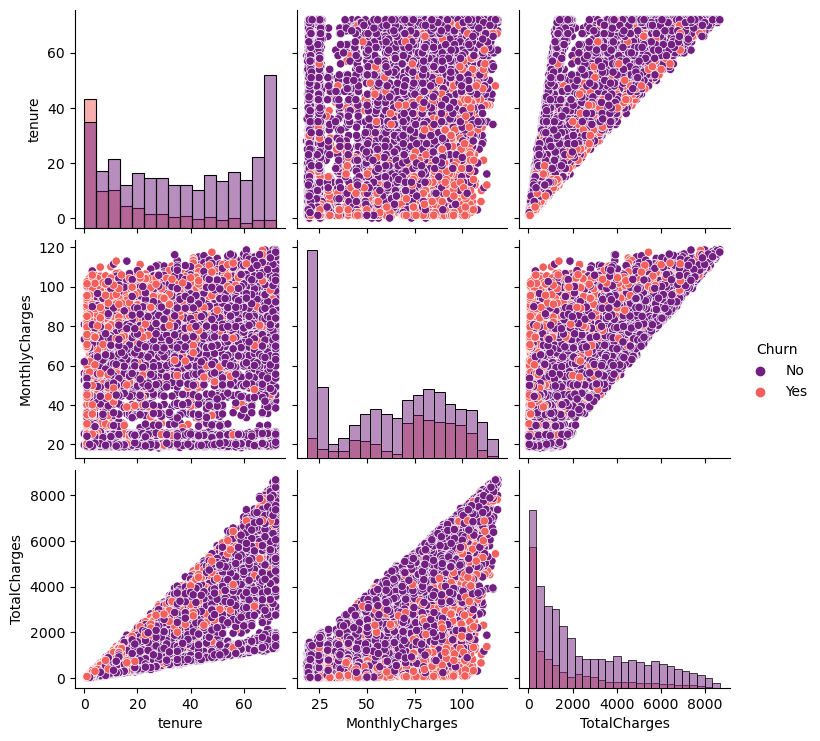

In [55]:
plt.figure(dpi=300,figsize=(18,12))
sns.pairplot(tel,hue="Churn",diag_kind='hist',palette="magma")
plt.show